In [20]:
import dataset
import models
import config
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
import os
import setproctitle
import argparse
from torchvision import transforms as tvt
import torch
import torch.nn as nn
import cv2
import torchvision
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import segmentation_models_pytorch

op_sigmoid = nn.Sigmoid()
diceloss = segmentation_models_pytorch.losses.DiceLoss(mode='binary')

# print (args)
setproctitle.setproctitle('__maruf__')

args = {
    'model': './checkpoints/epoch=11-step=947.ckpt'
}

topil = torchvision.transforms.ToPILImage()
transforms_img = tvt.Compose([        
        tvt.ToTensor(),
#         tvt.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])  

In [21]:
def predict():
    train_dl, val_dl, test_dl = dataset.get_data_loader()
    model = models.SemanticSegmentationModel().to(config.DEVICE)
    model = model.load_from_checkpoint(args['model']).to(config.DEVICE)
    model.eval()
    n = 0
    with torch.no_grad():
        for batch in test_dl:
            images, masks = batch['image'], batch['mask']
            original_images = batch['original_image']
            images = images.to(config.DEVICE)
            predictions, loss_predictions = model(images)
            print (predictions.size())
            predictions = op_sigmoid(predictions)
#             predictions = (op_sigmoid(predictions) > 0.1).type(torch.int)
            prediction = predictions[0][0].data.cpu().numpy()*255        
            mask = masks[0][0].data.cpu().numpy()*255        
            
            plt.figure(figsize=(30, 10))
            plt.subplot(131)
            plt.imshow(topil(original_images[0]))
            plt.subplot(132)
            plt.imshow(prediction)
            plt.subplot(133)
            plt.imshow(np.abs(prediction-mask))
            plt.show()
            cv2.imwrite('prediction%d.jpg'%n, prediction)
            n += 1
            
            if n>10: break
        # exit()
        

# predict()

In [22]:
center_crop = torchvision.transforms.CenterCrop((config.IMG_WIDTH, config.IMG_HEIGHT))

inv_normalize = torchvision.transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
    std=[1/0.229, 1/0.224, 1/0.255]
)

700


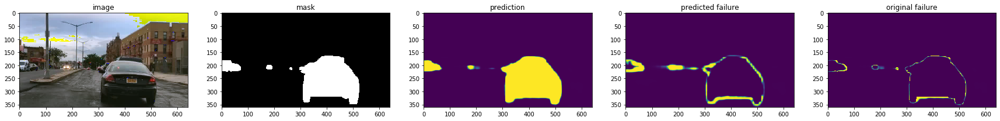

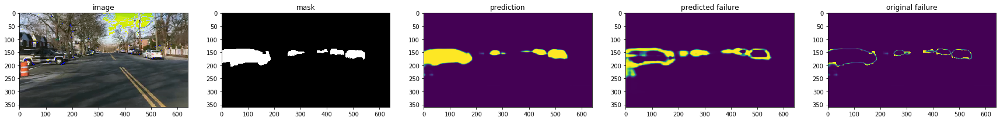

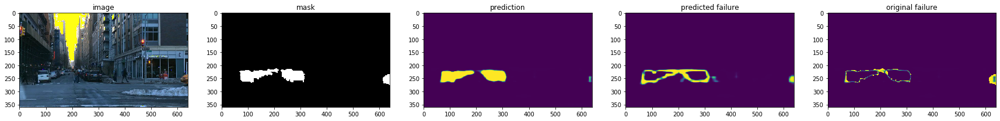

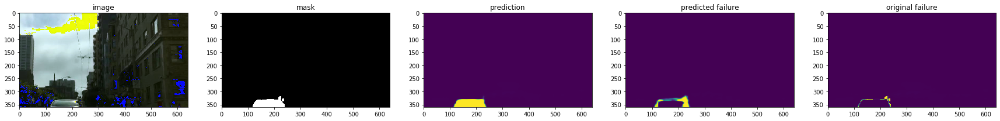

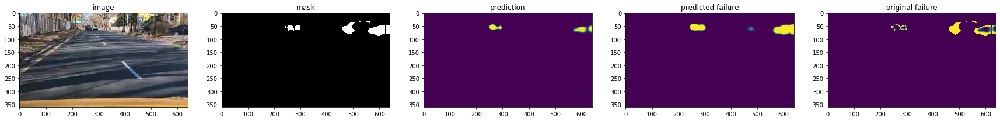

...

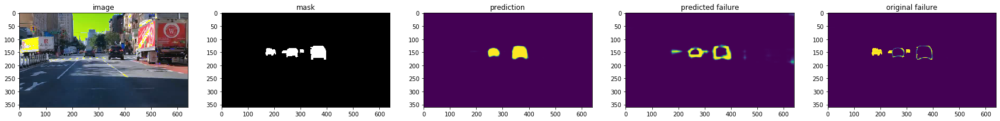

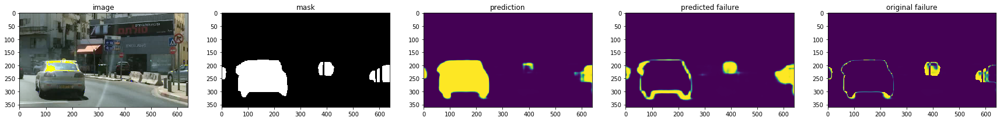

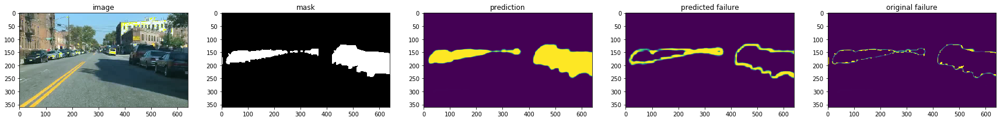

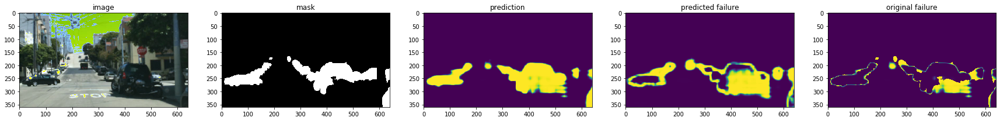

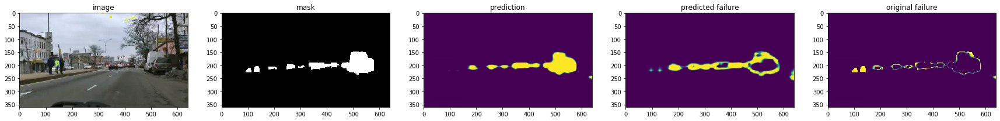

KeyboardInterrupt: 

In [23]:
def predict_two_head():
    train_dl, val_dl, test_dl = dataset.get_data_loader()
    model = models.SemanticSegmentationModel().to(config.DEVICE)
    model = model.load_from_checkpoint(args['model']).to(config.DEVICE)
    model.eval()
    n = 0
    print (len(test_dl.dataset))
    with torch.no_grad():
        for batch in test_dl:
            images, masks = batch['image'], batch['mask']
            original_images = batch['original_image']
            images = images.to(config.DEVICE)
            masks = masks.to(config.DEVICE)
            predictions, loss_predictions = model(images)
           
            predictions = op_sigmoid(predictions)
            loss_gt = diceloss(predictions[:, 0, :, :], masks)
#             predictions = (op_sigmoid(predictions) > 0.1).type(torch.int)
            prediction = predictions[0][0].data.cpu().numpy()*255        
            failure = predictions[0][1].data.cpu().numpy()*255  
            mask = masks[0][0].data.cpu().numpy()*255    
        
#             mask = masks[0][0].data.cpu().numpy()*255        
            
            plt.figure(figsize=(30, 10))
            
            plt.subplot(151)
            plt.imshow(topil(inv_normalize(images[0])))
            plt.title('image')
            
            plt.subplot(152)
            plt.imshow(topil(mask))
            plt.title('mask')
            
            plt.subplot(153)
            plt.imshow(prediction)
            plt.title('prediction')
            
            plt.subplot(154)            
            plt.imshow(failure)
            plt.title('predicted failure')
            
            plt.subplot(155)            
            plt.imshow(np.abs(prediction-mask))
            plt.title('original failure')
            
            plt.show()
#             cv2.imwrite('prediction%d.jpg'%n, prediction)
            n += 1
#             print (n)
#             print (n, 'loss pred', loss_predictions.mean().item(), 'loss gt', loss_gt.mean().item())
            
#             print (loss_gt)
            
            if n>50: break
        # exit()
        

predict_two_head()

In [10]:
! ls -lth ./checkpoints/

total 2.7G
-rw-rw-r-- 1 guest guest 298M Feb  1 03:03 'epoch=11-step=3779.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 31 20:26 'epoch=21-step=131.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 31 20:11 'epoch=3-step=23.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 31 10:33 'epoch=3-step=1259.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 31 07:55 'epoch=0-step=0.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 30 04:49 'epoch=7-step=2519.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 30 01:26 'epoch=2-step=630.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 29 23:22 'epoch=3-step=1016.ckpt'
-rw-rw-r-- 1 guest guest 298M Jan 29 21:34 'epoch=1-step=629.ckpt'


In [11]:
from glob import glob

In [12]:
bdd_images = glob('/home/guest/data_ssd/bdd/seg/images/train/*.jpg')
print (len(bdd_images))
segmodel = models.SemanticSegmentationModel().to(config.DEVICE)
segmodel = segmodel.load_from_checkpoint(args['model']).to(config.DEVICE)
segmodel.eval()
print ('loaded')

7000
loaded


In [36]:
for param in segmodel.model.model.segmentation_head.parameters():
    param.requires_grad = False
for param in segmodel.model.model.encoder.parameters():
    param.requires_grad = False
for param in segmodel.model.model.decoder.parameters():
    param.requires_grad = False
for param in list(segmodel.model.children())[1:]:
    print (param)

Conv2d(2, 4, kernel_size=(3, 3), stride=(2, 2))
Conv2d(4, 8, kernel_size=(3, 3), stride=(2, 2))
Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2))
Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Linear(in_features=3040, out_features=1, bias=True)
ReLU()
Sequential(
  (0): Conv2d(2, 4, kernel_size=(3, 3), stride=(2, 2))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(4, 8, kernel_size=(3, 3), stride=(2, 2))
  (4): ReLU()
  (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2))
  (7): ReLU()
  (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)
MSELoss()


In [32]:
list(segmodel.model.children())[1]

Conv2d(2, 4, kernel_size=(3, 3), stride=(2, 2))

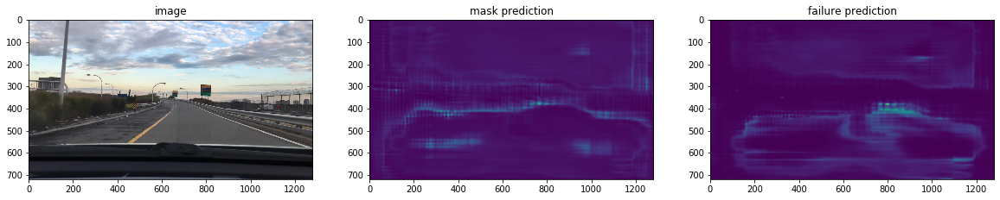

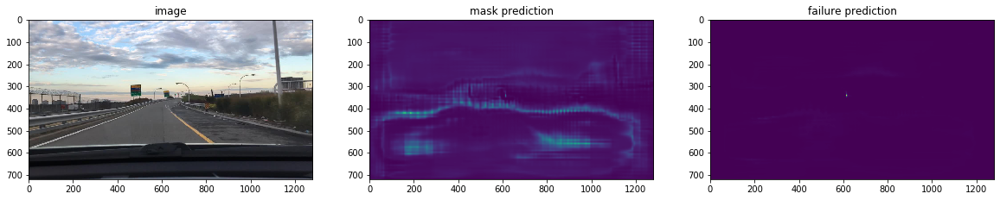

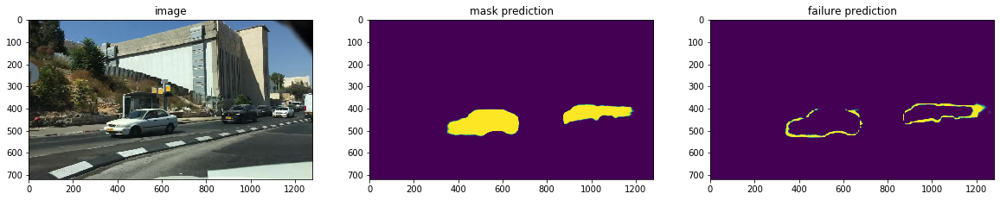

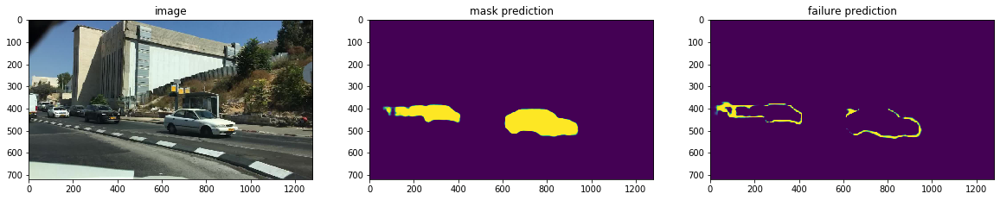

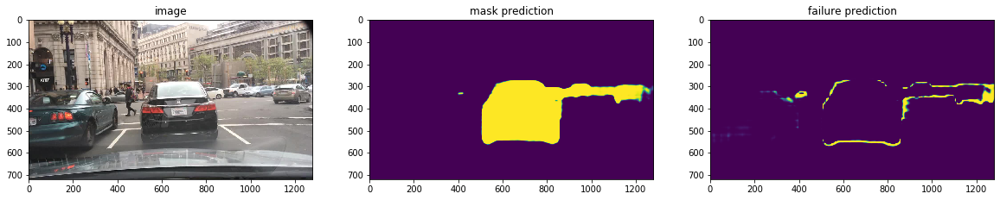

...

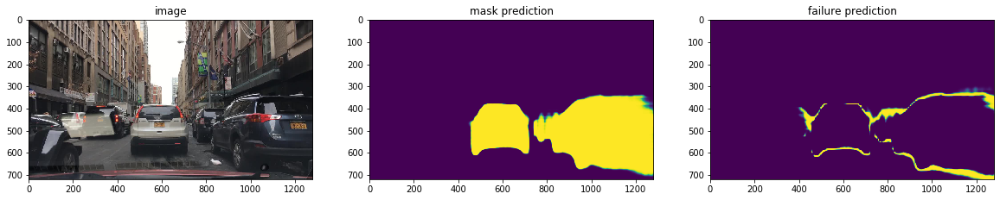

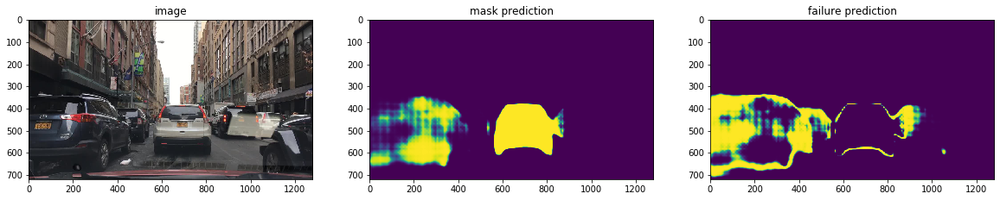

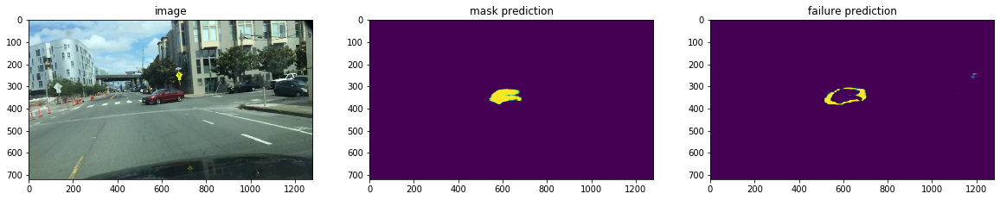

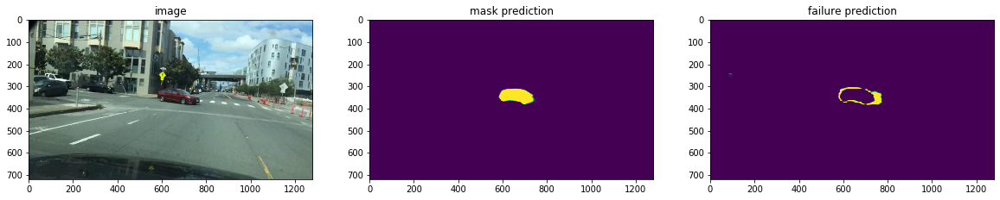

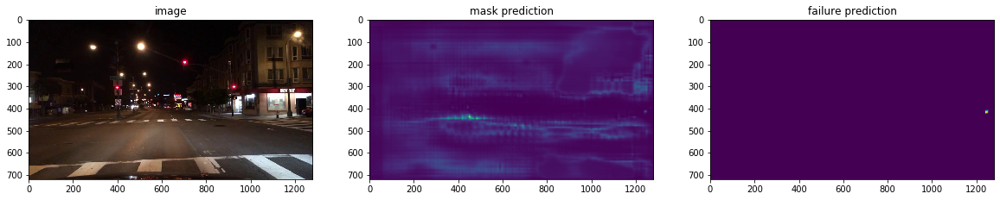

KeyboardInterrupt: 

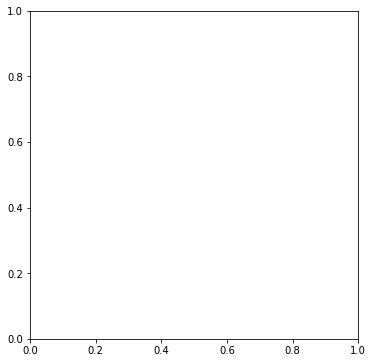

In [7]:
for idx, imgpath in enumerate(bdd_images):
    orig_img = Image.open(imgpath).convert('RGB')
    img_tensor = transforms_img(orig_img).unsqueeze(0).to(config.DEVICE)
    
    predictions = segmodel(img_tensor)
    predictions = op_sigmoid(predictions)
    prediction = predictions[0][0].data.cpu().numpy()*255        
    failure = predictions[0][1].data.cpu().numpy()*255  
    
    
    plt.figure(figsize=(20, 10))
    plt.subplot(131)
    plt.imshow(orig_img)
    plt.title('image')
    plt.subplot(132)
    plt.imshow(prediction)
    plt.title('mask prediction')
    plt.subplot(133)
    plt.imshow(failure)
    plt.title('failure prediction')
    plt.show()
    
    
    orig_img = torchvision.transforms.functional.hflip(orig_img)
    img_tensor = transforms_img(orig_img).unsqueeze(0).to(config.DEVICE)
    
    predictions = segmodel(img_tensor)
    predictions = op_sigmoid(predictions)
    prediction = predictions[0][0].data.cpu().numpy()*255        
    failure = predictions[0][1].data.cpu().numpy()*255  
    
    
    plt.figure(figsize=(20, 10))
    plt.subplot(131)
    plt.imshow(orig_img)
    plt.title('image')
    plt.subplot(132)
    plt.imshow(prediction)
    plt.title('mask prediction')
    plt.subplot(133)
    plt.imshow(failure)
    plt.title('failure prediction')
    plt.show()
    
    
    if idx>50:
        break           